## ETA Final Project (Exploratory Text Analysis of Harry Potter Books)

**Name: Chaitali Harge    
Computing ID: afj8am**

### Import Libraries

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from collections import Counter
import re
import string
import gensim
from wordcloud import WordCloud
from numpy.linalg import norm
from sklearn.decomposition import PCA
import plotly_express as px
import seaborn as sns
from scipy.linalg import eigh
from sklearn.decomposition import LatentDirichletAllocation as LDA
from sklearn.feature_extraction.text import CountVectorizer
from gensim.models import word2vec
from gensim.corpora import Dictionary
from sklearn.manifold import TSNE as tsne

### Import Data

In [3]:
file_path = "/Users/chaitaliharge/01_MSDS/03_Spring/02_DS5001/FinalProject/harry_potter_books.csv"
data = pd.read_csv(file_path)

In [4]:
# import LIB
file_path2 = "/Users/chaitaliharge/01_MSDS/03_Spring/02_DS5001/FinalProject/harry_potter_LIB.csv"
LIB = pd.read_csv(file_path2)

In [5]:
OHCO = ['book_id','chap_num', 'sent_num','token_num']

### Data Processing

In [6]:
# Extract Chapter and Book numbers from columns
data['book'] = data['book'].apply(lambda x: re.findall(r'\d+', x)[0])
data['chapter'] = data['chapter'].apply(lambda x: re.findall(r'\d+', x)[0])

# Converting 'book' and 'chapter' columns to numeric
data['book'] = pd.to_numeric(data['book'])
data['chapter'] = pd.to_numeric(data['chapter'])

# Change the column names
data.rename(columns={'book': 'book_id', 'chapter': 'chap_num'}, inplace=True)

In [120]:
data

,text,book_id,chap_num
0,"THE BOY WHO LIVED Mr. and Mrs. Dursley, of nu...",1,1
1,"four, Privet Drive, were proud to say that the...",1,1
2,thank you very much. They were the last people...,1,1
3,"be involved in anything strange or mysterious,...",1,1
4,with such nonsense. Mr. Dursley was the direc...,1,1
...,...,...,...
95080,son glide away from him....The last trace of s...,7,37
95081,autumn air. The train rounded a corner. Harry'...,7,37
95082,"in farewell.`He'll be alright,` murmured Ginny...",7,37
95083,his hand absentmindedly and touched the lightn...,7,37


In [175]:
df_grouped = data.groupby('book_id')['text'].apply(' '.join).reset_index()

# Calculate the total character count for each book
df_grouped['char_count'] = df_grouped['text'].apply(len)

# Calculate the average character count per book
average_characters_per_book = df_grouped['char_count'].mean()

In [176]:
average_characters_per_book

895711.2857142857

In [121]:
# Grouping text into chapters
CHAPS = data.groupby(['book_id', 'chap_num'], sort=False)['text'].apply(' '.join).to_frame('chap_str').reset_index()

In [122]:
CHAPS.set_index(['book_id', 'chap_num'], inplace=True)
CHAPS.rename(columns={'text': 'chap_str'}, inplace=True)

In [123]:
CHAPS

chap_str
book_id chap_num                                                   
1       1         THE BOY WHO LIVED  Mr. and Mrs. Dursley, of nu...
        2         THE VANISHING GLASS  Nearly ten years had pass...
        3         THE LETTERS FROM NO ONE  The escape of the Bra...
        4         THE KEEPER OF THE KEYS  BOOM. They knocked aga...
        5         DIAGON ALLEY  Harry woke early the next mornin...
...                                                             ...
7       33        Harry remained kneeling at Snape's side, simpl...
        34        Finally, the truth. Lying with his face presse...
        35        He lay facedown, listening to the silence. He ...
        36        He was flying facedown on the ground again. Th...
        37        Autumn seemed to arrive suddenly that year. Th...

[200 rows x 1 columns]

In [124]:
# Breaking down into sentences
sent_pat = r'[.?!;:]+'
SENTS = CHAPS['chap_str'].str.split(sent_pat, expand=True).stack()\
    .to_frame('sent_str')

In [125]:
SENTS.reset_index(inplace=True)
SENTS.columns = ['book_id', 'chap_num', 'sent_num', 'sent_str']

In [126]:
SENTS.set_index(['book_id', 'chap_num', 'sent_num'], inplace=True)

In [127]:
SENTS.head()

sent_str
book_id chap_num sent_num                                                   
1       1        0                                     THE BOY WHO LIVED  Mr
                 1                                                   and Mrs
                 2          Dursley, of number four, Privet Drive, were p...
                 3          They were the last people you'd expect to be ...
                 4                                                        Mr

### Creating TOKENS

In [15]:
# Splitting sent_str into tokens
token_pat = r"[\s',-]*\s+[\s',-]*"
TOKENS = SENTS['sent_str'].str.split(token_pat, expand=True).stack()\
    .to_frame('token_str')
TOKENS = TOKENS[TOKENS['token_str'].str.strip() != '']
TOKENS.reset_index(inplace=True)
TOKENS.columns = ['book_id', 'chap_num', 'sent_num', 'token_num', 'token_str']
TOKENS.set_index(['book_id', 'chap_num', 'sent_num', 'token_num'], inplace=True)

In [16]:
# Adding term_str column
TOKENS['term_str'] = TOKENS.token_str.replace(r'[\W_]+', '', regex=True).str.lower()

In [17]:
TOKENS

token_str  term_str
book_id chap_num sent_num token_num                    
1       1        0        0               THE       the
                          1               BOY       boy
                          2               WHO       who
                          3             LIVED     lived
                          4                Mr        mr
...                                       ...       ...
7       37       148      7          nineteen  nineteen
                          8             years     years
                 149      1               All       all
                          2               was       was
                          3              well      well

[1098761 rows x 2 columns]

In [18]:
# Saving TOKENS to CSV file
#TOKENS.to_csv('Harry_Potter_TOKENS.csv', index=True)

### Converting into CORPUS

In [19]:
# Download NLTK resources (only required once)
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

# Function to perform POS tagging
def pos_tagging(token_str):
    # Tokenize the sentence
    tokens = word_tokenize(token_str)
    # Perform POS tagging
    pos_tagged_tokens = nltk.pos_tag(tokens)
    # Extract POS tags
    pos_tags = [tag[1] for tag in pos_tagged_tokens]
    # Return POS tagging result and POS tags
    return pos_tagged_tokens, pos_tags

# Apply POS tagging function to each token string
TOKENS[['pos_tuple', 'pos']] = TOKENS['token_str'].apply(lambda x: pos_tagging(x)).apply(pd.Series)

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/chaitaliharge/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/chaitaliharge/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [20]:
# Get POS group
TOKENS['pos_tuple'] = TOKENS['pos_tuple'].apply(lambda x: ', '.join([str(elem) for elem in x])) # removing square brackets
TOKENS['pos'] = TOKENS['pos'].apply(lambda x: ', '.join([str(elem) for elem in x])) # removing square brackets
TOKENS['pos_group'] = TOKENS.pos.str[:2]

In [21]:
TOKENS

token_str  term_str           pos_tuple  \
book_id chap_num sent_num token_num                                           
1       1        0        0               THE       the       ('THE', 'DT')   
                          1               BOY       boy      ('BOY', 'NNP')   
                          2               WHO       who       ('WHO', 'WP')   
                          3             LIVED     lived     ('LIVED', 'NN')   
                          4                Mr        mr        ('Mr', 'NN')   
...                                       ...       ...                 ...   
7       37       148      7          nineteen  nineteen  ('nineteen', 'NN')   
                          8             years     years    ('years', 'NNS')   
                 149      1               All       all       ('All', 'DT')   
                          2               was       was      ('was', 'VBD')   
                          3              well      well      ('well', 'RB')   

                                     pos pos_group  
book_id chap_num sent_num token_num                 
1       1        0        0           DT        DT  
                          1          NNP        NN  
                          2           WP        WP  
                          3           NN        NN  
                          4           NN        NN  
...                                  ...       ...  
7       37       148      7           NN        NN  
                          8          NNS        NN  
                 149      1           DT        DT  
                          2          VBD        VB  
                          3           RB        RB  

[1098761 rows x 5 columns]

In [22]:
CORPUS = TOKENS.copy()

# Saving CORPUS to CSV file
#CORPUS.to_csv('Harry_Potter_CORPUS.csv', index=True)

### Creating VOCAB

In [23]:
VOCAB = CORPUS.term_str.value_counts().to_frame('n')
VOCAB.index.name = 'term_str'
VOCAB['max_pos'] = CORPUS.value_counts(['term_str','pos']).unstack().idxmax(1)

In [ ]:
# Adding p, i columns to VOCAB
VOCAB['p'] = VOCAB.n / VOCAB.n.sum()
VOCAB['i'] = np.log2(1/VOCAB.p)

In [180]:
# Sorting by dfidf
sorted_vocab = VOCAB.sort_values(by='dfidf', ascending=False)
sorted_vocab.head(20)

,n,max_pos,dfidf,p,i
term_str,,,,,
distant,98,NN,106.145809,0.000089,13.452736
eagerly,99,RB,106.145809,0.000090,13.438090
impatiently,97,RB,106.145809,0.000088,13.467533
send,116,NN,106.145809,0.000106,13.209465
deal,98,NN,106.145809,0.000089,13.452736
poor,110,JJ,106.145809,0.000100,13.286086
terrified,116,VBN,106.145809,0.000106,13.209465
sideways,107,NNS,106.145809,0.000097,13.325979
control,106,NN,106.145809,0.000096,13.339526


In [178]:
# Saving VOCAB to CSV file
VOCAB.to_csv('Harry_Potter_VOCAB.csv', index=True)

### Creating BOW

In [26]:
# Assigning Bags
SENTS = OHCO[:3]
CHAPS = OHCO[:2]
BOOKS = OHCO[:1]

In [27]:
# Define a function for BOW
def create_bow(CORPUS, bag, item_type='term_str'):
    BOW = CORPUS.groupby(bag+[item_type])[item_type].count().to_frame('n')
    return BOW

In [28]:
# Creating a BOW of chapters
BOW_chaps = create_bow(CORPUS, bag=CHAPS)

In [29]:
BOW_chaps

n
book_id chap_num term_str     
1       1                   68
                 a         112
                 able        2
                 about      14
                 above       1
...                        ...
7       37       youd        1
                 youll       4
                 younger     3
                 your        3
                 youre       3

[283480 rows x 1 columns]

In [30]:
# Saving BOW_chaps to CSV file
#BOW_chaps.to_csv('Harry_Potter_BOW_chaps.csv', index=True)

### Creating DTM

In [31]:
# Doucument Term Count Matrix
DTM = BOW_chaps.n.unstack(fill_value=0)

In [32]:
DTM

term_str               0  0111  1  10  100  101  102  104  105  ...  zograf  \
book_id chap_num                                                ...           
1       1          68  0     0  0   0    0    0    0    0    0  ...       0   
        2          40  0     0  0   0    0    0    0    0    0  ...       0   
        3          54  0     0  0   0    0    0    0    0    0  ...       0   
        4          86  0     0  1   0    0    0    0    0    0  ...       0   
        5         139  2     0  2   0    0    0    0    0    0  ...       0   
...               ... ..   ... ..  ..  ...  ...  ...  ...  ...  ...     ...   
7       33         66  0     0  0   0    0    0    0    0    0  ...       0   
        34          4  0     0  0   0    0    0    0    0    0  ...       0   
        35         20  0     0  0   0    0    0    0    0    0  ...       0   
        36         41  0     0  0   0    0    0    0    0    0  ...       0   
        37         11  0     0  0   0    0    0    0    0    0  ...       0   

term_str          zombie  zone  zonko  zonkos  zoo  zoological  zoom  zoomed  \
book_id chap_num                                                               
1       1              0     0      0       0    0           0     0       0   
        2              0     0      0       0    6           0     0       0   
        3              0     0      0       0    0           0     0       0   
        4              0     0      0       0    0           0     0       0   
        5              0     0      0       0    0           0     0       0   
...                  ...   ...    ...     ...  ...         ...   ...     ...   
7       33             0     0      0       0    0           0     0       0   
        34             0     0      0       0    0           0     0       0   
        35             0     0      0       0    0           0     0       0   
        36             0     0      0       0    0           0     0       0   
        37             0     0      0       0    0           0     0       0   

term_str          zooming  
book_id chap_num           
1       1               0  
        2               0  
        3               0  
        4               0  
        5               0  
...                   ...  
7       33              0  
        34              0  
        35              0  
        36              1  
        37              0  

[200 rows x 24600 columns]

#### Not saved to csv

In [33]:
# Saving DTM to CSV file
DTM.to_csv('Harry_Potter_DTM.csv', index=True)

### Creating TFIDF

In [34]:
# Define a function to get tfidf
def get_tfidf(BOW, tf_method='max', df_method='standard', item_type='term_str'):
            
    DTCM = BOW.n.unstack(fill_value=0) # Create Doc-Term Count Matrix
    
    if tf_method == 'sum':
        TF = (DTCM.T / DTCM.T.sum()).T
    elif tf_method == 'max':
        TF = (DTCM.T / DTCM.T.max()).T
    elif tf_method == 'log':
        TF = (np.log2(1 + DTCM.T)).T
    elif tf_method == 'raw':
        TF = DTCM
    elif tf_method == 'bool':
        TF = DTCM.astype('bool').astype('int')
    else:
        raise ValueError(f"TF method {tf_method} not found.")

    DF = DTCM.astype('bool').sum()
    N_docs = len(DTCM)
    
    if df_method == 'standard':
        IDF = np.log2(N_docs/DF) # This what the students were asked to use
    elif df_method == 'textbook':
        IDF = np.log2(N_docs/(DF + 1))
    elif df_method == 'sklearn':
        IDF = np.log2(N_docs/DF) + 1
    elif df_method == 'sklearn_smooth':
        IDF = np.log2((N_docs + 1)/(DF + 1)) + 1
    else:
        raise ValueError(f"DF method {df_method} not found.")
    
    TFIDF = TF * IDF
    DFIDF = DF * IDF
    TFIDF = TFIDF.fillna(0)

    return TFIDF, DFIDF

In [35]:
# TFIDF by chaps
TFIDF_chaps, DFIDF_chaps = get_tfidf(BOW_chaps, tf_method='max', df_method='standard')

In [36]:
TFIDF_chaps

term_str                           0  0111         1   10  100  101  102  104  \
book_id chap_num                                                                
1       1         0.019631  0.000000   0.0  0.000000  0.0  0.0  0.0  0.0  0.0   
        2         0.013015  0.000000   0.0  0.000000  0.0  0.0  0.0  0.0  0.0   
        3         0.014325  0.000000   0.0  0.000000  0.0  0.0  0.0  0.0  0.0   
        4         0.040197  0.000000   0.0  0.022110  0.0  0.0  0.0  0.0  0.0   
        5         0.029877  0.038846   0.0  0.020335  0.0  0.0  0.0  0.0  0.0   
...                    ...       ...   ...       ...  ...  ...  ...  ...  ...   
7       33        0.010449  0.000000   0.0  0.000000  0.0  0.0  0.0  0.0  0.0   
        34        0.001190  0.000000   0.0  0.000000  0.0  0.0  0.0  0.0  0.0   
        35        0.005979  0.000000   0.0  0.000000  0.0  0.0  0.0  0.0  0.0   
        36        0.005695  0.000000   0.0  0.000000  0.0  0.0  0.0  0.0  0.0   
        37        0.008874  0.000000   0.0  0.000000  0.0  0.0  0.0  0.0  0.0   

term_str          105  ...  zograf  zombie  zone  zonko  zonkos       zoo  \
book_id chap_num       ...                                                  
1       1         0.0  ...     0.0     0.0   0.0    0.0     0.0  0.000000   
        2         0.0  ...     0.0     0.0   0.0    0.0     0.0  0.187089   
        3         0.0  ...     0.0     0.0   0.0    0.0     0.0  0.000000   
        4         0.0  ...     0.0     0.0   0.0    0.0     0.0  0.000000   
        5         0.0  ...     0.0     0.0   0.0    0.0     0.0  0.000000   
...               ...  ...     ...     ...   ...    ...     ...       ...   
7       33        0.0  ...     0.0     0.0   0.0    0.0     0.0  0.000000   
        34        0.0  ...     0.0     0.0   0.0    0.0     0.0  0.000000   
        35        0.0  ...     0.0     0.0   0.0    0.0     0.0  0.000000   
        36        0.0  ...     0.0     0.0   0.0    0.0     0.0  0.000000   
        37        0.0  ...     0.0     0.0   0.0    0.0     0.0  0.000000   

term_str          zoological  zoom  zoomed   zooming  
book_id chap_num                                      
1       1                0.0   0.0     0.0  0.000000  
        2                0.0   0.0     0.0  0.000000  
        3                0.0   0.0     0.0  0.000000  
        4                0.0   0.0     0.0  0.000000  
        5                0.0   0.0     0.0  0.000000  
...                      ...   ...     ...       ...  
7       33               0.0   0.0     0.0  0.000000  
        34               0.0   0.0     0.0  0.000000  
        35               0.0   0.0     0.0  0.000000  
        36               0.0   0.0     0.0  0.007075  
        37               0.0   0.0     0.0  0.000000  

[200 rows x 24600 columns]

In [38]:
# Saving TFIDF to CSV file
TFIDF_chaps.to_csv('Harry_Potter_TFIDF_chaps.csv', index=True)

### Reduced and Normalized TFIDF_L2

In [39]:
# Adding dfidf to VOCAB table
VOCAB['dfidf'] = DFIDF_chaps

In [40]:
n_terms = 1000
vocab_filter = 'dfidf'
pos_list = "NN NNS VB VBD VBG VBN VBP VBZ JJ JJR JJS RB RBR RBS".split() # Open categories with no proper nouns

In [41]:
VIDX = VOCAB.loc[VOCAB.max_pos.isin(pos_list)]\
    .sort_values(vocab_filter, ascending=False)\
    .head(n_terms).index

In [42]:
# Reduce TFIDF feature space
M = TFIDF_chaps[VIDX].fillna(0).groupby('book_id').mean() # MUST FILLNA

In [43]:
M

term_str,screamed,sideways,eagerly,deal,distant,dunno,impatiently,send,fall,terrified,...,longer,thin,spoken,crying,support,pretend,ended,snatched,blame,buried
book_id,,,,,,,,,,,,,,,,,,,,,
1,0.005110,0.001799,0.003061,0.001034,0.001262,0.003676,0.001205,0.008355,0.004589,0.003610,...,0.000860,0.002553,0.000510,0.004508,0.000000,0.002592,0.000831,0.001999,0.002172,0.001579
2,0.001186,0.002790,0.005235,0.005951,0.003052,0.001435,0.002007,0.001747,0.002008,0.001412,...,0.001850,0.003625,0.003700,0.004431,0.003209,0.001214,0.002954,0.002410,0.002544,0.001490
3,0.003525,0.003284,0.001648,0.002811,0.002648,0.000991,0.001760,0.003274,0.004199,0.003186,...,0.002555,0.005723,0.001873,0.001285,0.002654,0.002024,0.002828,0.002255,0.002200,0.001353
4,0.002854,0.002446,0.002743,0.003040,0.001956,0.003270,0.003204,0.005988,0.003197,0.003660,...,0.002830,0.002761,0.002186,0.002116,0.003996,0.002100,0.002432,0.002259,0.002193,0.002453
5,0.004319,0.004094,0.004984,0.003246,0.002548,0.004673,0.004901,0.001909,0.001935,0.003056,...,0.003578,0.003026,0.001976,0.003413,0.002866,0.002212,0.002019,0.002230,0.002346,0.001444
6,0.002821,0.002171,0.001685,0.001673,0.003642,0.004558,0.002640,0.002978,0.002847,0.003573,...,0.004516,0.003345,0.001883,0.003147,0.002188,0.003159,0.001820,0.000814,0.003419,0.000865
7,0.005275,0.002975,0.000794,0.001884,0.003227,0.002467,0.001106,0.002139,0.002385,0.004013,...,0.004502,0.002751,0.002738,0.001468,0.002396,0.002325,0.001819,0.001803,0.000874,0.003737


In [44]:
# Normalize TFIDF for distance measuring
TFIDF_L2 = M.apply(lambda x: x / norm(x), 1) # Euclidean

In [45]:
TFIDF_L2

term_str,screamed,sideways,eagerly,deal,distant,dunno,impatiently,send,fall,terrified,...,longer,thin,spoken,crying,support,pretend,ended,snatched,blame,buried
book_id,,,,,,,,,,,,,,,,,,,,,
1,0.027001,0.009506,0.016173,0.005466,0.006669,0.019426,0.006365,0.044148,0.024250,0.019075,...,0.004546,0.013489,0.002693,0.023824,0.000000,0.013698,0.004391,0.010564,0.011476,0.008346
2,0.007928,0.018655,0.035001,0.039786,0.020405,0.009598,0.013421,0.011677,0.013427,0.009443,...,0.012371,0.024235,0.024740,0.029623,0.021458,0.008115,0.019749,0.016114,0.017009,0.009963
3,0.016890,0.015737,0.007896,0.013470,0.012690,0.004748,0.008433,0.015689,0.020119,0.015268,...,0.012243,0.027425,0.008975,0.006160,0.012718,0.009698,0.013551,0.010805,0.010544,0.006484
4,0.022266,0.019079,0.021398,0.023719,0.015262,0.025508,0.024996,0.046718,0.024938,0.028551,...,0.022078,0.021540,0.017057,0.016511,0.031178,0.016379,0.018973,0.017622,0.017110,0.019135
5,0.028899,0.027396,0.033352,0.021724,0.017049,0.031273,0.032800,0.012776,0.012952,0.020451,...,0.023941,0.020251,0.013225,0.022838,0.019182,0.014803,0.013509,0.014921,0.015699,0.009661
6,0.020822,0.016026,0.012441,0.012347,0.026881,0.033644,0.019486,0.021985,0.021016,0.026372,...,0.033334,0.024693,0.013896,0.023229,0.016154,0.023318,0.013433,0.006005,0.025239,0.006382
7,0.021575,0.012166,0.003247,0.007706,0.013198,0.010088,0.004521,0.008749,0.009754,0.016412,...,0.018414,0.011251,0.011198,0.006005,0.009799,0.009509,0.007440,0.007375,0.003575,0.015284


In [46]:
# Saving TFIDF_L2 to CSV file
TFIDF_L2.to_csv('Harry_Potter_TFIDF_L2.csv', index=True)

### PCA Components

In [47]:
# Define a function
def get_pca(TFIDF, 
            k=10, 
            norm_docs=True,
            norm_level=2,
            center_by_mean=True, 
            center_by_variance=False):
    
    # if TFIDF.isna().sum().sum():
    #     print("Filled NA")
    #     TFIDF = TFIDF.fillna(0)
    
    if norm_docs:
        # TFIDF = TFIDF.apply(lambda x: x / norm(x), 1).fillna(0)
        TFIDF = (TFIDF.T / norm(TFIDF, 2, axis=1)).T
    
    if center_by_mean:
        TFIDF = TFIDF - TFIDF.mean()
        
    if center_by_variance:
        TFIDF = TFIDF / TFIDF.std()        

    COV = TFIDF.cov()

    eig_vals, eig_vecs = eigh(COV)
    
    EIG_VEC = pd.DataFrame(eig_vecs, index=COV.index, columns=COV.index)
    EIG_VAL = pd.DataFrame(eig_vals, index=COV.index, columns=['eig_val'])
    EIG_VAL.index.name = 'term_str'
        
    EIG_IDX = EIG_VAL.eig_val.sort_values(ascending=False).head(k)
    
    COMPS = EIG_VEC[EIG_IDX.index].T
    COMPS.index = [i for i in range(COMPS.shape[0])]
    COMPS.index.name = 'pc_id'
    

    LOADINGS = COMPS.T

    DCM = TFIDF.dot(LOADINGS)
    
    COMPINF = pd.DataFrame(index=COMPS.index)

    for i in range(k):
        for j in [0, 1]:
            top_terms = ' '.join(LOADINGS.sort_values(i, ascending=bool(j)).head(5).index.to_list())
            COMPINF.loc[i, j] = top_terms
    COMPINF = COMPINF.rename(columns={0:'pos', 1:'neg'})
    
    COMPINF['eig_val'] = EIG_IDX.reset_index(drop=True).to_frame()
    COMPINF['exp_var'] = COMPINF.eig_val / COMPINF.eig_val.sum()
    
    return LOADINGS, DCM, COMPINF

In [48]:
LOADINGS, DCM, COMPINF = get_pca(TFIDF_chaps[VIDX], 
                                 norm_docs=True, 
                                 norm_level=2, 
                                 center_by_mean=False, 
                                 center_by_variance=False)

In [49]:
COMPINF

,pos,neg,eig_val,exp_var
pc_id,,,,
0,c eaters bill albus eater,sirius sir fudge ter yeh,0.079144,0.264489
1,mcgonagall team wood class filch,uncle aunt dursleys kitchen mrs,0.040703,0.136026
2,lupin sirius mrs fudge bill,ter yeh uncle aunt sir,0.034151,0.114130
3,lupin ter yeh uncle dementors,mrs ginny bill percy sir,0.027255,0.091084
4,lupin wood team slytherin mcgonagall,fudge ter yeh sirius forest,0.024056,0.080393
5,mrs ter bill yeh percy,sir lord sirius snake fudge,0.023296,0.077853
6,fudge wood team percy madam,sirius towards ginny lupin yeh,0.021610,0.072217
7,sir lupin lord eaters snake,sirius towards c fudge class,0.017899,0.059815
8,wood sirius team ginny eaters,sir class lupin fudge lesson,0.016953,0.056654


In [50]:
# Saving PCA Components to CSV file
COMPINF.to_csv('Harry_Potter_PCA_Components.csv', index=True)

In [51]:
LOADINGS

pc_id,0,1,2,3,4,5,6,7,8,9
term_str,,,,,,,,,,
screamed,0.012064,0.008204,0.003984,0.012000,0.001085,-0.036153,0.004026,0.007361,0.043260,0.014205
sideways,0.000823,0.006041,0.003381,-0.002611,-0.005267,-0.014320,-0.012361,0.002170,0.035267,0.022357
eagerly,-0.013767,0.012394,0.000325,-0.015915,-0.000125,-0.005880,-0.012734,-0.015654,-0.002335,0.000080
deal,-0.006252,0.006379,-0.005464,-0.006045,0.008375,-0.010405,0.001468,-0.003026,-0.016457,-0.011965
distant,-0.000117,0.010504,-0.007159,0.001366,0.000924,-0.013380,-0.009286,-0.006600,0.009112,0.008022
...,...,...,...,...,...,...,...,...,...,...
pretend,-0.003594,0.001551,-0.002394,-0.004094,-0.012802,-0.006610,-0.006955,0.001559,-0.000484,0.011476
ended,-0.005697,0.008408,0.000920,-0.006279,0.005686,0.010090,0.004887,0.010034,-0.004687,0.005021
snatched,-0.000470,-0.001992,-0.000537,-0.003267,0.000747,0.005047,-0.005127,-0.011805,0.004092,-0.004109


In [52]:
# Saving Loadings to CSV file
LOADINGS.to_csv('Harry_Potter_Loadings.csv', index=True)

In [53]:
DCM

pc_id                    0         1         2         3         4         5  \
book_id chap_num                                                               
1       1        -0.080217 -0.095893  0.028559 -0.161461  0.028296  0.118492   
        2        -0.050637 -0.634257 -0.134610  0.019622  0.106554 -0.072429   
        3        -0.059132 -0.747487 -0.168592  0.074223  0.134984 -0.007240   
        4        -0.126593 -0.192561 -0.382507  0.380291 -0.374108  0.373698   
        5        -0.134269  0.056966 -0.301199  0.188377 -0.328414  0.335105   
...                    ...       ...       ...       ...       ...       ...   
7       33        0.799491  0.125491 -0.010246  0.012106  0.016530 -0.014187   
        34        0.224472  0.122795  0.222158  0.116539 -0.042810 -0.093265   
        35        0.447941  0.100435 -0.031156 -0.056357 -0.090605 -0.109889   
        36        0.494533  0.173846 -0.012569  0.001470 -0.085834 -0.108798   
        37        0.026325  0.037531  0.022368 -0.146004  0.045099  0.095705   

pc_id                    6         7         8         9  
book_id chap_num                                          
1       1        -0.058120 -0.030060 -0.065075  0.022190  
        2        -0.079368 -0.062211  0.051333  0.071524  
        3        -0.058866 -0.137045 -0.018796 -0.015276  
        4        -0.153783  0.018701 -0.038453 -0.089899  
        5        -0.135832 -0.001650 -0.065534 -0.070682  
...                    ...       ...       ...       ...  
7       33       -0.048870 -0.151478 -0.050200 -0.040122  
        34       -0.203398  0.058929  0.149313  0.097703  
        35       -0.052755  0.010029 -0.057001 -0.001629  
        36       -0.108420  0.035769  0.109426  0.086458  
        37       -0.062561 -0.013132  0.034197  0.215466  

[200 rows x 10 columns]

In [54]:
# Saving DCM to CSV file
DCM.to_csv('Harry_Potter_DCM.csv', index=True)

### Creating DOC table

In [55]:
# Reset index of the TFIDF DataFrame and select 'book_id' and 'chap_num'
book_ids = TFIDF_chaps.reset_index()[['book_id','chap_num']]
DOC = pd.merge(book_ids, LIB, on='book_id').set_index(['book_id','chap_num'])

In [56]:
DOC['label'] = DOC['title'].astype(str) + '_' + DOC['author'] + '_' + DOC['year'].astype(str)

In [57]:
DOC

title      author  year  \
book_id chap_num                                          
1       1         Philosopher's Stone  JK Rowling  1997   
        2         Philosopher's Stone  JK Rowling  1997   
        3         Philosopher's Stone  JK Rowling  1997   
        4         Philosopher's Stone  JK Rowling  1997   
        5         Philosopher's Stone  JK Rowling  1997   
...                               ...         ...   ...   
7       33            Deathly Hallows  JK Rowling  2007   
        34            Deathly Hallows  JK Rowling  2007   
        35            Deathly Hallows  JK Rowling  2007   
        36            Deathly Hallows  JK Rowling  2007   
        37            Deathly Hallows  JK Rowling  2007   

                                                label  
book_id chap_num                                       
1       1         Philosopher's Stone_JK Rowling_1997  
        2         Philosopher's Stone_JK Rowling_1997  
        3         Philosopher's Stone_JK Rowling_1997  
        4         Philosopher's Stone_JK Rowling_1997  
        5         Philosopher's Stone_JK Rowling_1997  
...                                               ...  
7       33            Deathly Hallows_JK Rowling_2007  
        34            Deathly Hallows_JK Rowling_2007  
        35            Deathly Hallows_JK Rowling_2007  
        36            Deathly Hallows_JK Rowling_2007  
        37            Deathly Hallows_JK Rowling_2007  

[200 rows x 4 columns]

### PCA Visualization

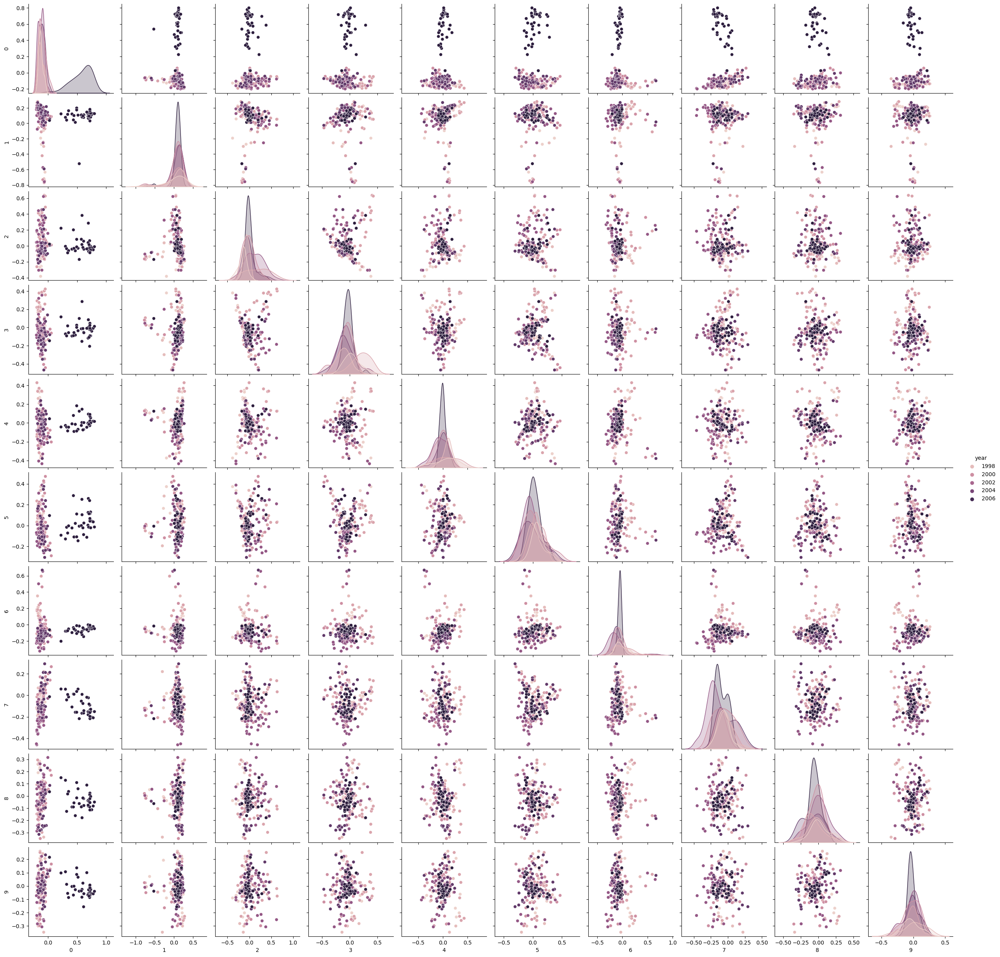

In [58]:
# Creating COMPINF DataFrame (component information table)
COMPINF = DCM.join(DOC, on=['book_id', 'chap_num'])
sns.pairplot(COMPINF.iloc[:, :], hue='year')

In [59]:
# Function to visualize PCAs
def vis_pcs(M, a, b, label='title', hover_name='label', symbol=None, size=None):
    return px.scatter(M, x=a, y=b, color=label, hover_name=hover_name, 
                     symbol=symbol, size=size,
                     marginal_x='box', height=800)

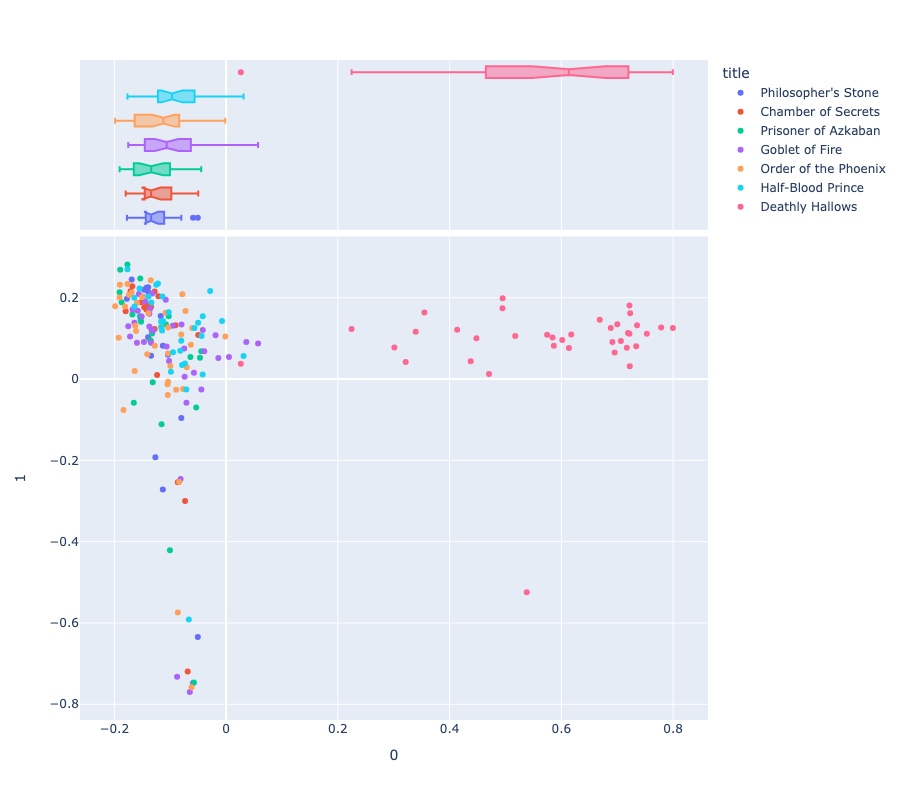

In [60]:
vis_pcs(COMPINF, 0, 1)

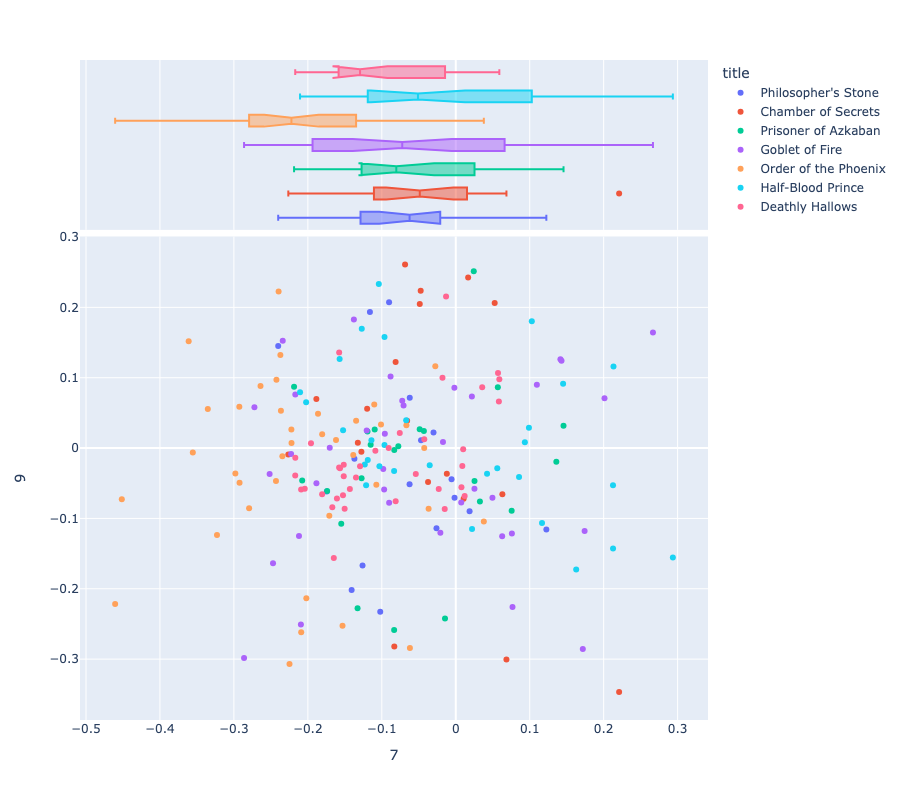

In [61]:
vis_pcs(COMPINF, 7, 9)

In [70]:
# Adding p, i columns to VOCAB
VOCAB['p'] = VOCAB.n / VOCAB.n.sum()
VOCAB['i'] = np.log2(1/VOCAB.p)

In [71]:
VSHORT = VOCAB[VOCAB.max_pos.isin(['NN', 'VB', 'JJ']) & ~VOCAB.max_pos.isin(['NNP'])].sort_values('dfidf', ascending=False).head(5000)

In [72]:
# Visualize Loadings
def vis_loadings(a=0, b=1, hover_name='term_str'):
    X = LOADINGS.join(VSHORT)
    return px.scatter(X.reset_index(), a, b, 
                      text='term_str', size='i', color='max_pos', 
                      marginal_x='box', height=800)

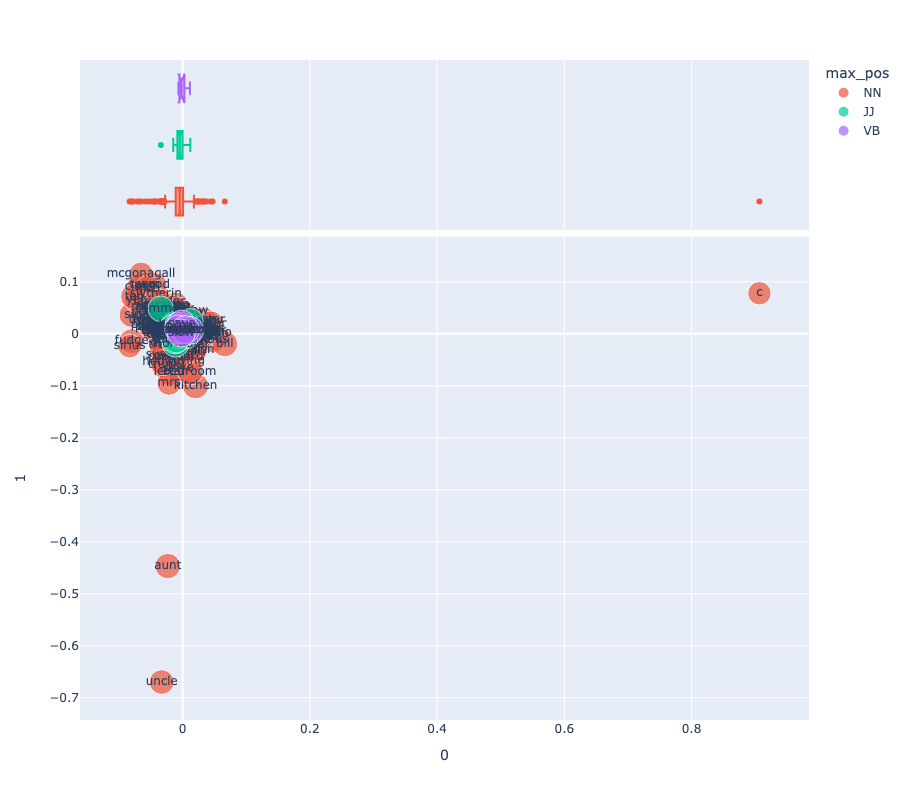

In [73]:
# Plot LOADINGS 
vis_loadings(0,1)

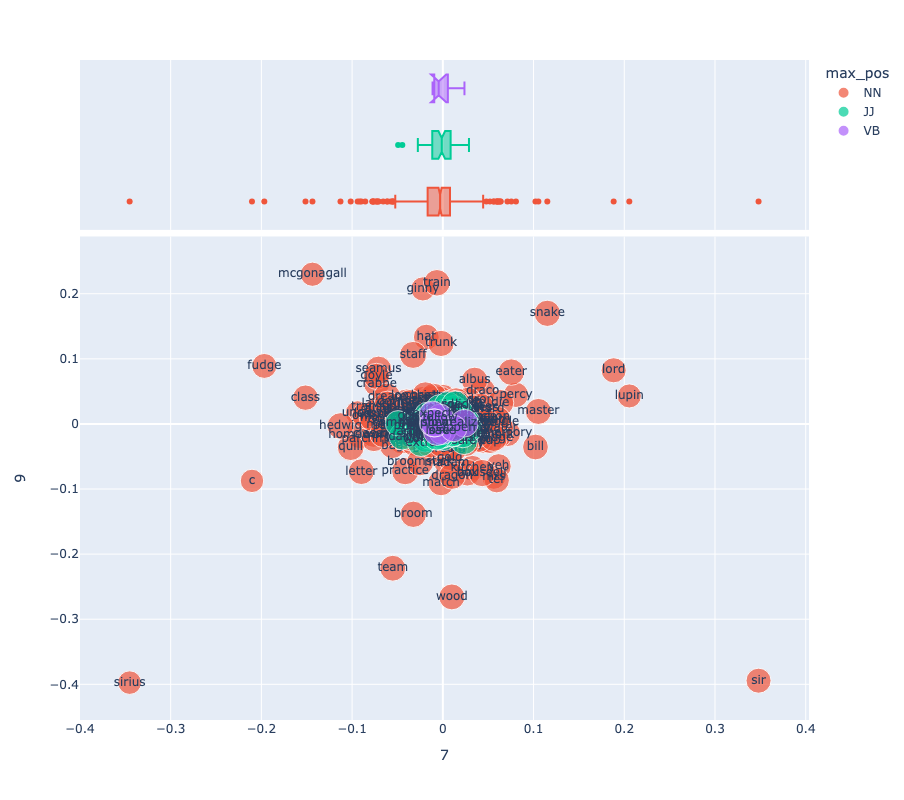

In [181]:
vis_loadings(7,9)

### LDA Topic

In [87]:
ngram_range = (1, 2)
n_terms = 4000
n_topics = 40
max_iter = 20
n_top_terms = 9

In [88]:
lda_engine = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)

In [89]:
# Topic names
TNAMES = [f"T{str(x).zfill(len(str(n_topics)))}" for x in range(n_topics)]

In [91]:
count_engine = CountVectorizer(max_features=n_terms, ngram_range=ngram_range, stop_words='english')
count_model = count_engine.fit_transform(CHAPS.chap_str)
TERMS = count_engine.get_feature_names_out()

In [92]:
lda_model = lda_engine.fit_transform(count_model)

### THETA

In [93]:
THETA = pd.DataFrame(lda_model, index=CHAPS.index)
THETA.columns.name = 'topic_id'
THETA.columns = TNAMES

In [94]:
colors = "YlGnBu"
THETA.sample(10).T.style.background_gradient(cmap=colors, axis=None)

### PHI

In [95]:
PHI = pd.DataFrame(lda_engine.components_, columns=TERMS, index=TNAMES)
PHI.index.name = 'topic_id'
PHI.columns.name = 'term_str'

In [96]:
PHI.T.sample(10).style.background_gradient(cmap=colors, axis=None)

topic_id,T00,T01,T02,T03,T04,T05,T06,T07,T08,T09,T10,T11,T12,T13,T14,T15,T16,T17,T18,T19,T20,T21,T22,T23,T24,T25,T26,T27,T28,T29,T30,T31,T32,T33,T34,T35,T36,T37,T38,T39
term_str,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
dursley,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,45.736371,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,42.313629,0.025000,0.025000,0.025000,0.025000,0.025000
dolores umbridge,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,18.525715,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.057953,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,5.491332,0.025000,0.025000,0.025000,0.025000
worn,0.025000,1.531152,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.698165,0.025000,0.025000,5.520122,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,6.128637,0.025000,0.025000,0.025000,0.025000,0.025000,1.080696,0.025000,0.025000,0.025000,0.025000,9.191228
fluttered,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,2.380397,0.025000,0.025000,0.025000,0.025000,8.203112,0.025000,2.948038,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,3.783134,0.737560,0.025000,0.025000,0.025000,0.025000,0.584861,0.025000,0.025000,0.025000,0.025000,11.537897
told said,0.025000,8.559935,0.025000,0.025000,0.025000,0.025000,3.056575,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,17.458490,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000
contact,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,7.086030,15.489852,2.272756,15.882492,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,4.473286,0.025000,3.545830,0.025000,0.025000,0.025000,0.025000,0.025000,7.420774,9.588192,1.875543,2.615244,0.025000,0.025000
elder wand,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,59.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000
bought,0.025000,3.048222,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,3.213565,0.025000,1.585733,0.025000,0.025000,10.909816,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,5.219914,0.025000,0.025000,0.025000,0.025000,0.025000,8.007106,0.025000,1.647832,0.025000,0.025000,29.567812
armor,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,11.091515,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,16.983400,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,16.000084


### TOPIC by mean document weight

In [97]:
TOPICS = PHI.stack().groupby('topic_id')\
    .apply(lambda x: ' '.join(x.sort_values(ascending=False).head(n_top_terms).reset_index().term_str))\
    .to_frame('top_terms')


TOPICS['mean_doc_weight'] = THETA.mean(axis=0)
TOPICS['term_freq'] = PHI.sum(1) / PHI.sum(1).sum()

In [99]:
TOPICS.sort_values('mean_doc_weight', ascending=False).style.background_gradient(cmap=colors)

,top_terms,mean_doc_weight,term_freq
topic_id,,,
T15,harry said ron hermione professor said harry just said ron looked,0.293920,0.315979
T39,harry said ron hermione know said ron just ve got,0.123904,0.125270
T17,harry hermione said wand ron did saw death face,0.121166,0.117288
T28,said harry weasley mrs mrs weasley ron ginny fred mr weasley,0.064875,0.068835
T34,harry uncle vernon uncle vernon dudley said aunt petunia aunt petunia,0.056119,0.042051
T10,harry said ron malfoy lockhart slytherin gryffindor wood team,0.052032,0.049916
T29,harry said lupin black snape sirius hermione ron said lupin,0.049686,0.047538
T35,dumbledore harry said did know knew voldemort like think,0.038102,0.034902
T01,dumbledore said harry said dumbledore slughorn voldemort riddle did yes,0.035902,0.035769


### Sentiment VOCAB_SENT

In [100]:
# Importing Salex_nrc lexicon set
SALEX = pd.read_csv("salex_nrc.csv").set_index('term_str')
SALEX.columns = [col.replace('nrc_','') for col in SALEX.columns]

In [101]:
SALEX

,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,sentiment
term_str,,,,,,,,,,,
abandon,0,0,0,1,0,1,0,1,0,0,-1
abandoned,1,0,0,1,0,1,0,1,0,0,-1
abandonment,1,0,0,1,0,1,0,1,1,0,-1
abduction,0,0,0,1,0,1,0,1,1,0,-1
aberration,0,0,1,0,0,1,0,0,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...
young,0,1,0,0,1,0,1,0,1,0,1
youth,1,1,0,1,1,0,1,0,1,0,1
zeal,0,1,0,0,1,0,1,0,1,1,1


In [102]:
V = pd.concat([VOCAB.reset_index().set_index('term_str'), SALEX], join='inner', axis=1)

In [103]:
V.head()

,n,max_pos,dfidf,p,i,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,sentiment
term_str,,,,,,,,,,,,,,,,
harry,16700,NNP,0.000000,0.015199,6.039886,1,0,0,0,0,1,0,1,0,0,-1
professor,2007,NNP,68.246091,0.001827,9.096621,0,0,0,0,0,0,1,0,0,1,1
good,984,JJ,16.782260,0.000896,10.124932,0,1,0,0,1,0,1,0,1,1,1
black,862,JJ,37.425727,0.000785,10.315902,0,0,0,0,0,1,0,1,0,0,-1
death,755,NN,85.517825,0.000687,10.507113,1,1,1,1,0,1,0,1,1,0,-1


In [104]:
# Saving V to csv file
V.to_csv('Harry_Potter_VOCAB_SENT.csv', index=True)

### Sentiment BOW_SENT

In [105]:
emo_cols = "anger anticipation disgust fear joy sadness surprise trust sentiment".split()
B = BOW_chaps.join(V[['max_pos'] + emo_cols], on='term_str', rsuffix='_v').dropna()

In [106]:
B

n max_pos  anger  anticipation  disgust  fear  joy  \
book_id chap_num term_str                                                       
1       1        amuse     1      NN    0.0           0.0      0.0   0.0  1.0   
                 angry     1      JJ    1.0           0.0      1.0   0.0  0.0   
                 anxious   1      JJ    0.0           1.0      0.0   1.0  0.0   
                 approve   1      VB    0.0           0.0      0.0   0.0  1.0   
                 aunt      2      NN    0.0           0.0      0.0   0.0  0.0   
...                       ..     ...    ...           ...      ...   ...  ...   
7       37       vanished  1     NNS    0.0           0.0      0.0   1.0  0.0   
                 watch     2      NN    0.0           1.0      0.0   1.0  0.0   
                 white     1      JJ    0.0           1.0      0.0   0.0  1.0   
                 worried   1      JJ    0.0           0.0      0.0   0.0  0.0   
                 worry     2      NN    0.0           1.0      0.0   1.0  0.0   

                           sadness  surprise  trust  sentiment  
book_id chap_num term_str                                       
1       1        amuse         0.0       0.0    0.0        1.0  
                 angry         0.0       0.0    0.0       -1.0  
                 anxious       0.0       0.0    0.0       -1.0  
                 approve       0.0       0.0    1.0        1.0  
                 aunt          0.0       0.0    1.0        1.0  
...                            ...       ...    ...        ...  
7       37       vanished      1.0       1.0    0.0       -1.0  
                 watch         0.0       0.0    0.0        0.0  
                 white         0.0       0.0    1.0        1.0  
                 worried       1.0       0.0    0.0       -1.0  
                 worry         1.0       0.0    0.0       -1.0  

[32828 rows x 11 columns]

In [107]:
# Saving B to csv file
B.to_csv('Harry_Potter_BOW_SENT.csv', index=True)

### Sentiment DOC_SENT

In [108]:
EMO_CHAPS = B.groupby(['book_id','chap_num'])[emo_cols].mean()

In [109]:
EMO_CHAPS 

anger  anticipation   disgust      fear       joy  \
book_id chap_num                                                         
1       1         0.230769      0.259615  0.153846  0.298077  0.326923   
        2         0.286957      0.278261  0.243478  0.347826  0.286957   
        3         0.295652      0.226087  0.278261  0.286957  0.200000   
        4         0.325926      0.214815  0.259259  0.392593  0.244444   
        5         0.276316      0.282895  0.243421  0.322368  0.282895   
...                    ...           ...       ...       ...       ...   
7       33        0.337121      0.223485  0.242424  0.359848  0.212121   
        34        0.229508      0.221311  0.188525  0.377049  0.254098   
        35        0.310345      0.218391  0.252874  0.402299  0.247126   
        36        0.324444      0.244444  0.151111  0.413333  0.271111   
        37        0.225806      0.322581  0.129032  0.306452  0.354839   

                   sadness  surprise     trust  sentiment  
book_id chap_num                                           
1       1         0.288462  0.211538  0.326923   0.000000  
        2         0.321739  0.243478  0.278261  -0.165217  
        3         0.286957  0.113043  0.260870  -0.321739  
        4         0.340741  0.177778  0.229630  -0.362963  
        5         0.269737  0.197368  0.335526  -0.105263  
...                    ...       ...       ...        ...  
7       33        0.352273  0.178030  0.280303  -0.242424  
        34        0.336066  0.139344  0.319672  -0.188525  
        35        0.339080  0.143678  0.321839  -0.160920  
        36        0.355556  0.182222  0.302222  -0.177778  
        37        0.322581  0.177419  0.306452  -0.080645  

[200 rows x 9 columns]

In [110]:
# Save EMO_CHAPS 
EMO_CHAPS.to_csv('Harry_Potter_EMO_CHAPS.csv', index=True)

### Sentiment Plot

In [111]:
# Creating a dataframe for sentiments of book 1 = Philosopher's stone
Book1_chaps = EMO_CHAPS.loc[1] 

In [112]:
#Book1_chaps

In [113]:
# Sentiment by chapters for book 7 = Deathly Hallows
Book7_chaps = EMO_CHAPS.loc[7] 
#Book7_chaps

In [114]:
# Function to plot sentiment
def plot_sentiments(df, emo='sentiment', title=None):
    FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45, title=title)
    df[emo].plot(**FIG)

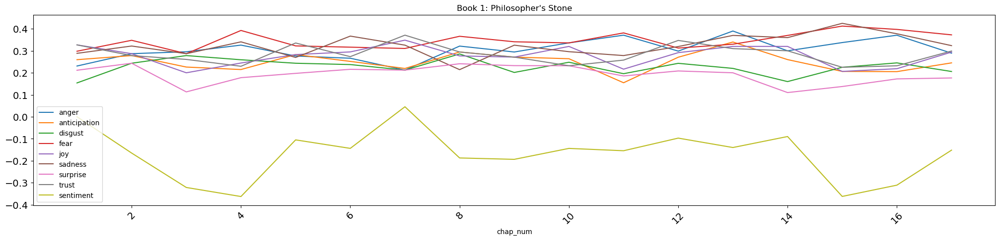

In [115]:
plot_sentiments(Book1_chaps, emo_cols, title="Book 1: Philosopher's Stone")

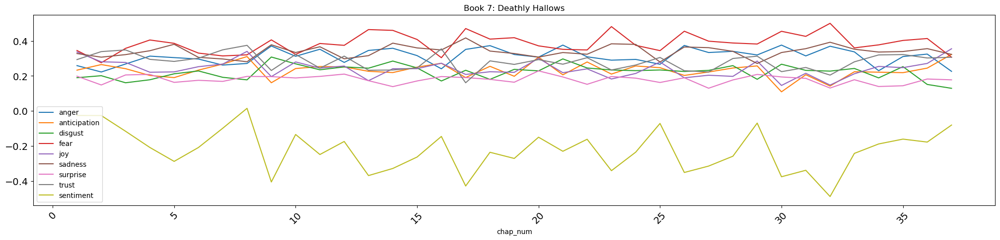

In [116]:
plot_sentiments(Book7_chaps, emo_cols, title="Book 7: Deathly Hallows")

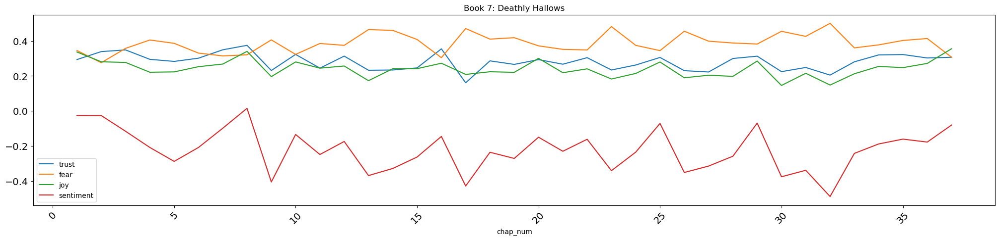

In [117]:
plot_sentiments(Book7_chaps, ['trust','fear','joy','sentiment'], title="Book 7: Deathly Hallows")

### VOCAB_W2V

In [131]:
# Generate table of words
# word2vec parameters
w2v_params = dict(
    window = 2,
    vector_size = 246,
    min_count = 50, 
    workers = 4
)

In [132]:
# Gensim-style corpus of docs, a list of lists of tokens
CHAPS = OHCO[:2]
docs = CORPUS.dropna(subset=['term_str'])\
    .groupby(CHAPS)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()
docs = [doc for doc in docs if len(doc) > 1]

In [133]:
corpora = Dictionary(docs)

In [134]:
# Generate word embeddings with Gensim's module
model = word2vec.Word2Vec(docs, **w2v_params)

In [135]:
#model.wv.vectors

In [136]:
# Convert model to dataframe
def get_vector(row):
    w = row.name
    try:
        vec = model.wv[w]
    except KeyError as e:
        vec = None
    return vec

In [137]:
WV = pd.DataFrame(VOCAB.apply(get_vector, axis=1).dropna()).apply(lambda x: pd.Series(x[0]), axis=1)
WV

,0,1,2,3,4,5,6,7,8,9,...,236,237,238,239,240,241,242,243,244,245
term_str,,,,,,,,,,,,,,,,,,,,,
the,-0.382691,-0.197089,0.286631,0.182260,-0.500931,-0.107058,0.454504,0.046453,-0.006845,-0.209586,...,-0.003377,0.147332,-0.226938,0.103333,-0.235471,0.048541,0.016462,-0.021958,-0.062366,0.198088
and,0.265502,-0.163466,-0.258150,0.250834,-0.102044,0.002712,-0.101237,0.008324,0.069165,0.147731,...,0.292150,0.237583,-0.331993,-0.129376,0.279417,-0.272215,-0.043424,-0.088801,-0.043935,-0.139902
to,0.852558,-0.430907,0.540057,-0.173351,0.590109,-0.064855,-0.345734,0.183178,-1.249885,0.283804,...,-0.335451,1.093643,-0.655200,0.327328,0.309974,-0.212165,-0.173855,0.023109,-0.613382,0.543864
of,-0.954761,-0.182269,-0.232565,-0.741790,-0.239944,0.297913,0.177644,-0.202537,-0.298747,0.164432,...,0.127297,-0.901293,0.094513,-0.043566,0.653968,0.257533,-0.315930,-0.414110,-0.285885,0.715616
a,0.024396,-0.712850,-0.523758,0.494363,0.061069,0.159069,-0.520139,0.410578,0.253623,0.143704,...,-0.142222,0.552641,0.329928,0.669828,0.069921,0.273106,-0.906090,-0.047132,0.060100,0.176363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
comes,-0.186574,-0.148307,-0.049757,-0.019319,-0.102486,-0.133023,0.088736,0.099493,-0.113977,-0.085403,...,0.031576,-0.051429,0.130335,-0.134060,0.073081,-0.145970,-0.179291,0.167682,0.122036,-0.028567
raise,-0.141310,-0.175333,0.023804,-0.051738,-0.044445,-0.139911,-0.164941,-0.101737,-0.084689,-0.182669,...,0.109017,0.215414,-0.004134,0.019203,0.197528,-0.133436,0.075336,-0.079576,0.031083,0.008548
keeps,-0.047932,-0.236610,-0.163339,-0.139642,0.041433,-0.013256,-0.019105,0.062720,-0.212062,-0.056558,...,0.129466,0.000839,-0.049047,-0.106953,0.067434,-0.002301,0.047896,-0.004440,0.055841,0.067021


In [138]:
# Save Word2Vec to csv file:
WV.to_csv('Harry_Potter_VOCAB_W2V.csv', index=True)

### Word2vec tSNE Plot

In [139]:
# Use ScikitLearn's TSNE library
tsne_engine = tsne(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
tsne_model = tsne_engine.fit_transform(WV.to_numpy())
TSNE = pd.DataFrame(tsne_model, columns=['x','y'], index=WV.index)

In [140]:
# Joing the TSNE table with VOCAB table
X = TSNE.join(VOCAB, how='left')

In [141]:
X

,x,y,n,max_pos,dfidf,p,i
term_str,,,,,,,
the,-25.518427,27.939308,51685,DT,0.000000,0.047039,4.409988
and,-12.808060,-14.212225,27381,CC,0.000000,0.024920,5.326559
to,38.117020,-6.644396,26937,TO,0.000000,0.024516,5.350145
of,19.843235,14.431769,21731,IN,0.000000,0.019778,5.659979
a,-19.093004,26.209833,21008,DT,0.000000,0.019120,5.708795
...,...,...,...,...,...,...,...
comes,33.450638,-3.794109,50,VBZ,96.114681,0.000046,14.423590
raise,29.064964,21.262060,50,NN,92.877124,0.000046,14.423590
keeps,32.218586,-3.500301,50,NNS,90.072904,0.000046,14.423590


In [142]:
# Adding column of log values of n
X['log_n'] = np.log(X['n'])

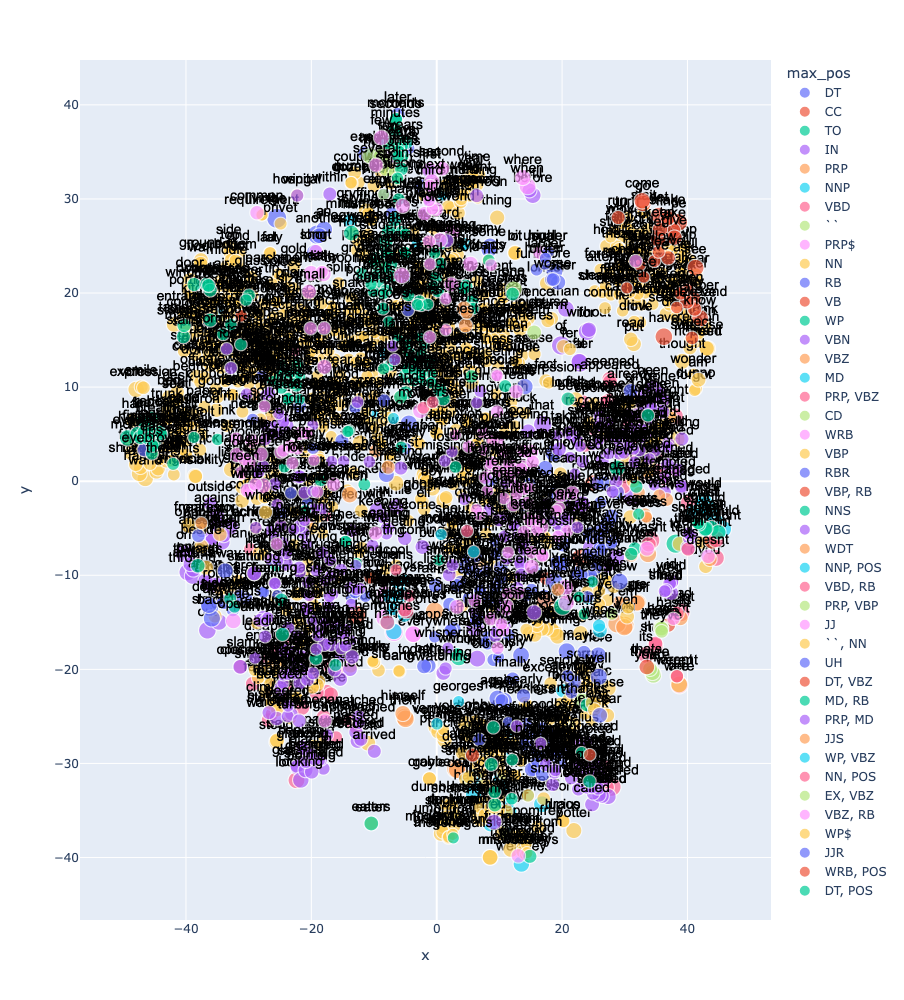

In [143]:
# Visualize tSNE coordinates
px.scatter(X.reset_index(), 'x', 'y', 
           text='term_str', 
           color='max_pos', 
           hover_name='term_str',          
           size='log_n',
           height=1000).update_traces(
                mode='markers+text', 
                textfont=dict(color='black', size=14, family='Arial'),
                textposition='top center')

### Wordcloud

In [199]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

VOCAB_cloud = VOCAB.copy()
VOCAB_cloud = VOCAB.reset_index()

In [197]:
filtered_vocab = VOCAB_cloud[(VOCAB_cloud['max_pos'] == 'NN') & (VOCAB_cloud['n'] > 5)]

# Remove stopwords
stop_words = set(stopwords.words('english'))
filtered_vocab = filtered_vocab[~filtered_vocab['term_str'].isin(stop_words)]

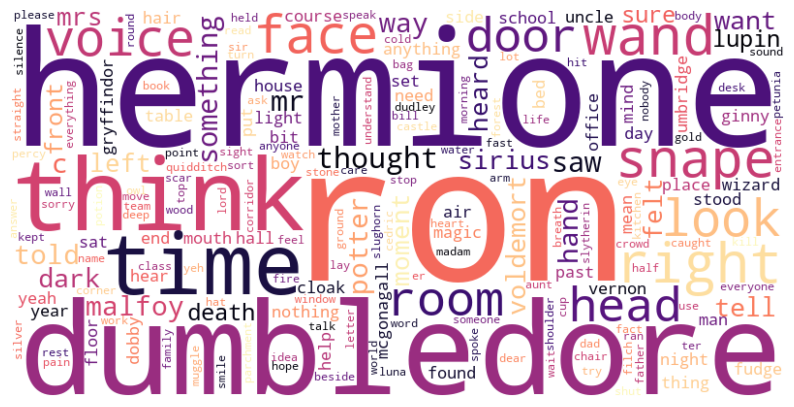

In [210]:
word_freq = dict(zip(filtered_vocab['term_str'], filtered_vocab['n']))

# Generate wordcloud
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='magma').generate_from_frequencies(word_freq)

# Display the wordcloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Riff 1 : Sentiment Plot

In [144]:
# Using VADER
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

In [145]:
cols = SENTS.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
vader = pd.concat([SENTS, cols], axis=1)

In [146]:
vader.head()

sent_str  \
book_id chap_num sent_num                                                      
1       1        0                                     THE BOY WHO LIVED  Mr   
                 1                                                   and Mrs   
                 2          Dursley, of number four, Privet Drive, were p...   
                 3          They were the last people you'd expect to be ...   
                 4                                                        Mr   

                             neg    neu    pos  compound  
book_id chap_num sent_num                                 
1       1        0         0.000  1.000  0.000    0.0000  
                 1         0.000  1.000  0.000    0.0000  
                 2         0.000  0.575  0.425    0.8779  
                 3         0.176  0.824  0.000   -0.5423  
                 4         0.000  1.000  0.000    0.0000

<Axes: xlabel='book_id,chap_num,sent_num'>

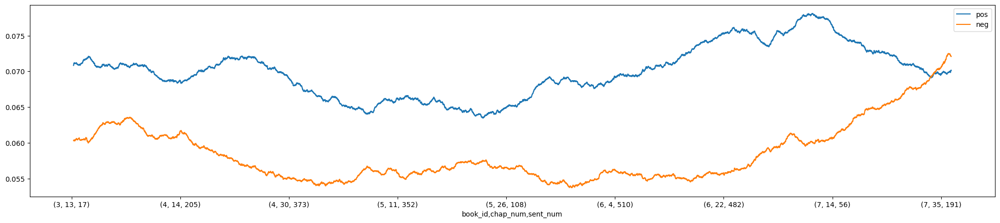

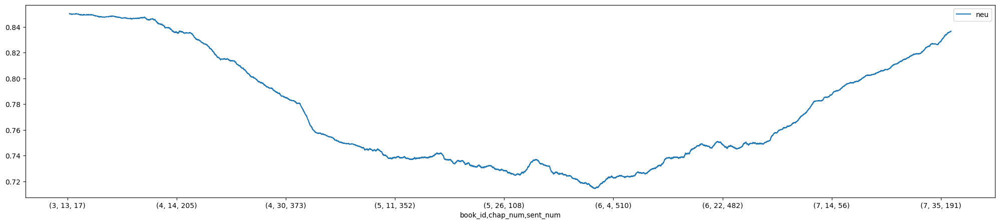

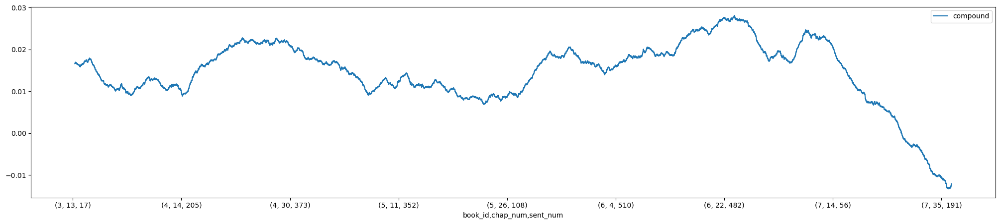

In [147]:
w = int(vader.shape[0] / 5)
vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

### Riff 2 : Topic Contiguity

In [155]:
# Topic Pairs
from scipy.spatial.distance import pdist

tpairs_idx = [(a, b) for a, b in pd.MultiIndex.from_product([TOPICS.index, TOPICS.index]) if a < b]

In [156]:
TPAIRS = pd.DataFrame(tpairs_idx, columns=['topic_id_x', 'topic_id_y']).set_index(['topic_id_x', 'topic_id_y'])

In [157]:
TPAIRS['theta_cityblock'] = pdist(THETA.T, 'cityblock')
TPAIRS['theta_cosine'] = pdist(THETA.T, 'cosine')
TPAIRS['theta_canberra'] = pdist(THETA.T, 'canberra')
TPAIRS['theta_jaccard'] = pdist(THETA.T, 'jaccard')
TPAIRS['theta_js'] = pdist(THETA.T, 'jensenshannon')

In [158]:
TPAIRS['phi_cityblock'] = pdist(PHI, 'cityblock')
TPAIRS['phi_cosine'] = pdist(PHI, 'cosine')
TPAIRS['phi_canberra'] = pdist(PHI, 'canberra')
TPAIRS['phi_jaccard'] = pdist(PHI, 'jaccard')
TPAIRS['phi_js'] = pdist(PHI, 'jensenshannon')

In [163]:
TPAIRS['corr_theta'] = THETA.corr(method='kendall').stack()
TPAIRS['corr_phi'] = PHI.T.corr(method='kendall').stack()
TPAIRS['corr_mean'] = (TPAIRS.corr_theta + TPAIRS.corr_phi) / 2

In [164]:
TPAIRS = TPAIRS.reset_index()
TPAIRS['label_x'] = TPAIRS.topic_id_x.map(TOPICS.top_terms)
TPAIRS['label_y'] = TPAIRS.topic_id_y.map(TOPICS.top_terms)
TPAIRS = TPAIRS.set_index(['topic_id_x','topic_id_y'])

In [165]:
TPAIRS.head()

theta_cityblock  theta_cosine  theta_canberra  \
topic_id_x topic_id_y                                                  
T00        T01               11.394799      0.946631       98.646824   
           T02                6.428936      0.981608       61.930120   
           T03                4.864401      0.775953       36.897170   
           T04                4.864401      0.775953       36.897170   
           T05                4.864401      0.775953       36.897170   

                       theta_jaccard  theta_js  phi_cityblock  phi_cosine  \
topic_id_x topic_id_y                                                       
T00        T01                  0.61  0.794406   20593.853347    0.358911   
           T02                  0.59  0.793720   14401.294051    0.840263   
           T03                  0.74  0.713035   13368.282791    0.808693   
           T04                  0.74  0.713035   13368.282791    0.808693   
           T05                  0.74  0.713035   13368.282791    0.808693   

                       phi_canberra  phi_jaccard    phi_js  corr_theta  \
topic_id_x topic_id_y                                                    
T00        T01          1444.511467      0.72725  0.597805    0.087236   
           T02          1267.191812      0.70325  0.662097    0.394171   
           T03           997.787326      0.65775  0.660064    0.582613   
           T04           997.787326      0.65775  0.660064    0.582613   
           T05           997.787326      0.65775  0.660064    0.582613   

                       corr_phi  corr_mean  \
topic_id_x topic_id_y                        
T00        T01         0.196692   0.141964   
           T02         0.157967   0.276069   
           T03              NaN        NaN   
           T04              NaN        NaN   
           T05              NaN        NaN   

                                                                 label_x  \
topic_id_x topic_id_y                                                      
T00        T01         harry dumbledore said moody crouch cedric bagm...   
           T02         harry dumbledore said moody crouch cedric bagm...   
           T03         harry dumbledore said moody crouch cedric bagm...   
           T04         harry dumbledore said moody crouch cedric bagm...   
           T05         harry dumbledore said moody crouch cedric bagm...   

                                                                 label_y  
topic_id_x topic_id_y                                                     
T00        T01         dumbledore said harry said dumbledore slughorn...  
           T02         fudge minister said said fudge prime prime min...  
           T03         aback presents power powerful powers practice ...  
           T04         aback presents power powerful powers practice ...  
           T05         aback presents power powerful powers practice ...

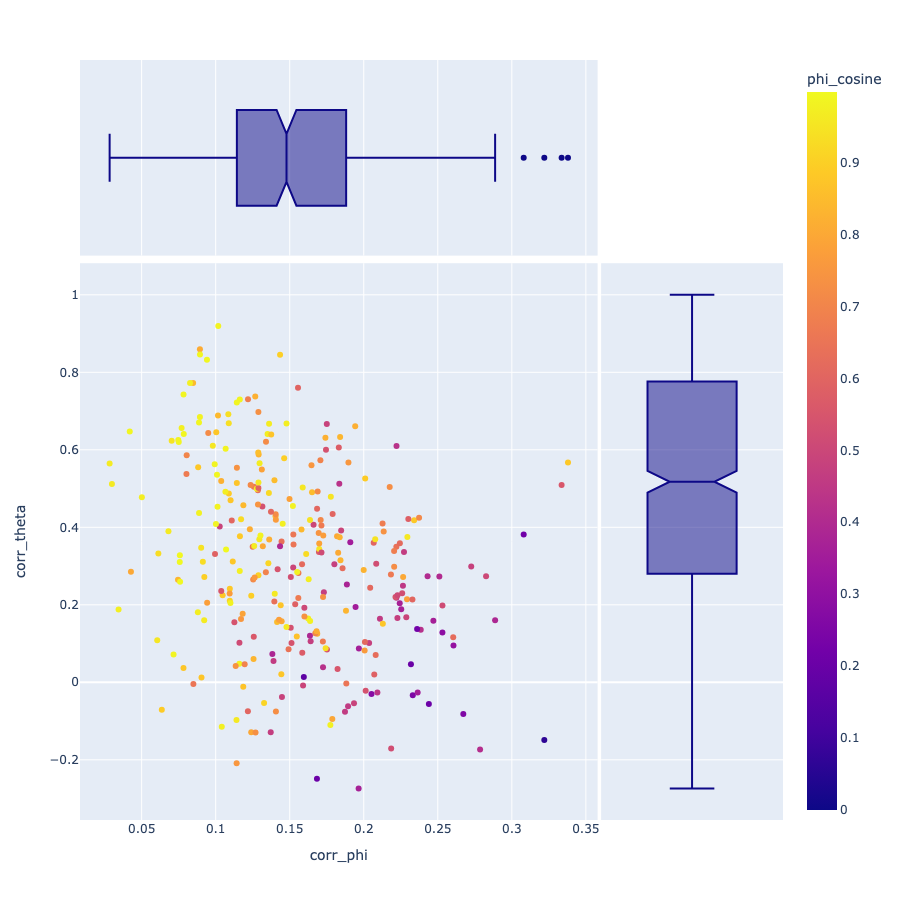

In [166]:
px.scatter(TPAIRS, 'corr_phi', 'corr_theta', 
           color='phi_cosine',
           hover_data=['label_x', 'label_y'],
           marginal_x='box', marginal_y='box',
           width=900, height=900)

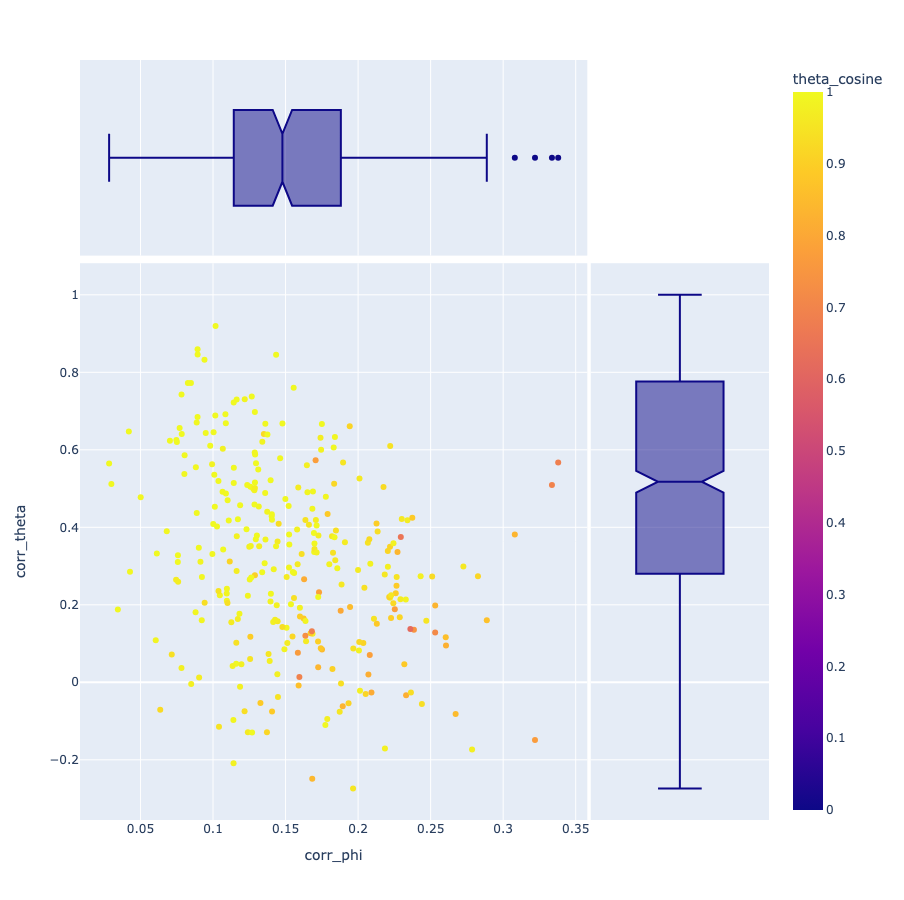

In [167]:
px.scatter(TPAIRS, 'corr_phi', 'corr_theta', 
           color='theta_cosine',
           hover_data=['label_x', 'label_y'],
           marginal_x='box', marginal_y='box',
           width=900, height=900)

### Riff 3: tSNE Plot